# TP: Propagación de Fake News y su impacto en la afinidad política de una sociedad

## Descripción del modelo

Este modelo surge de la pregunta: ¿Cómo influye la propagación de fake news en la afinidad política de las personas?
Para intentar responderla decidimos realizar un modelo mediante el cual representamos una dinámica simplificada de la propagación de una noticia falsa en diversos grupos sociales y cómo ésta puede modificar el pensamiento o afinidad politica hacia un determinado partido político en cada grupo social.


Para esto proponemos modelar un generador de fake news, que envía las mismas a distintos medios de comunicación, quienes a su vez las dispersan en los grupos sociales. 
Luego, los grupos sociales al sacar una conclusión respecto a la fake news, emiten su opinión al resto de los grupos a través de las redes sociales.

## Modelo conceptual 


El modelo cuenta con diferentes hipótesis:

    - Sólo consideramos dos bandos políticos: oficialismo y oposición
    - Hay dos tipos de medios de comunicación: oficialista y oposición
    - Las fakenews atacan a uno de los dos bandos políticos

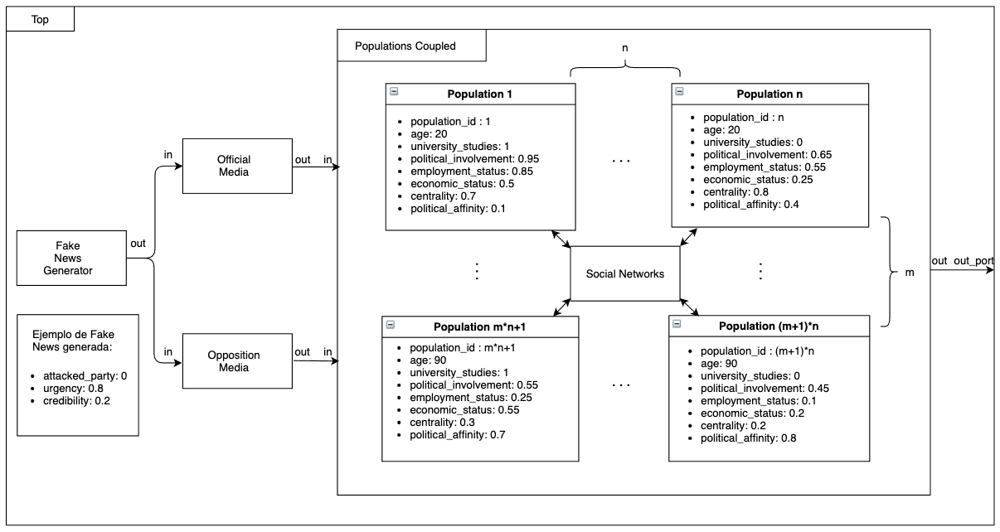

In [1]:
from IPython import display
display.Image("./model.png")

El modelo contará con un generador de fake news, con dos medios de comunicación (oficialista y opositor como detallabamos en las hipótesis), con 8 poblaciones de diferentes características y para representar la conexión entre ellas proponemos las redes sociales.

Las poblaciones contarán con diferentes características: 

    - Edad 
    - Estudios universitarios
    - Nivel de involucramiento político
    - Estado laboral
    - Nivel económico
    - Centralidad
    
  Y además el siguiente trait dinámico
  
    - Afinidad política
   el cuál va cambiando a medida que el grupo interactúa con las distintas fake news.  
    


De esta manera proponemos otras hipótesis que regirán el comportamiento de cada población ante una fake news:

- Es más probable creer en una fake news recibida de un medio si:
    - No fuiste a la universidad
    - Estás en algún extremo socioeconómico
    - Tu estado laboral es precario
    - Tu involucramiento en la política es bajo
    - Coincidencia entre la afinidad política de la fake y la de la población receptora
    - Coincidencia entre la afinidad política del medio emisor la fake y la de la población receptora
    - La fake news trata un tema urgente


- Es más probable creer en una fake news recibida de otra población si:
    - Se comparte una mayor cantidad de traits con la población de la que se recibe la fake news
    - La centralidad de la población emisora es alta
    - La creencia de la población emisora en la fake news es alta 
    - Coincidencia del bando político de la fake news con la afinidad política de la población receptora


## Descripción de los atómicos y acoplados

### Atómico: Generador
Cada fake news que emite el generador tiene la siguiente información: 

    - Afinidad al gobierno: 0/1 (0 = afin oposición , 1= afin oficialismo)
    - Urgencia de la noticia: valor real [0,1]
    - Credibilidad: valor real [0,1]
    

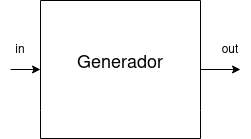

In [3]:
from IPython import display
display.Image("./generador.png")

### Atómico: Medios de comunicación

 Cada fake news que "llega" al medio, luego se emite a los grupos sociales con la misma información que antes, sólo que el valor de credibilidad puede modificarse. (Si el medio y la fake coinciden en su afinidad al gobierno entonces la credibilidad se mantiene en el mismo valor, si el medio tiene afinidad opuesta a la fake news el campo de credibilidad se convierte en "0")

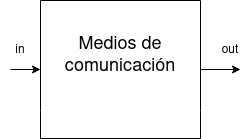

In [4]:
from IPython import display
display.Image("./medios.png")

### Acoplado: Poblaciones

El acoplado contiene dos tipos de atómicos: Población y Redes sociales. 
El acoplado recibirá como entrada las fake news de los medios de comunicación y las enitirá a las población existentes dentro del mismo. 
Luego las poblaciones emitirán sus opiniones a las redes sociales, que emitirá las mismas a las poblaciones restantes. 
El acoplado emite como salida las opiniones emitidas desde las redes sociales.

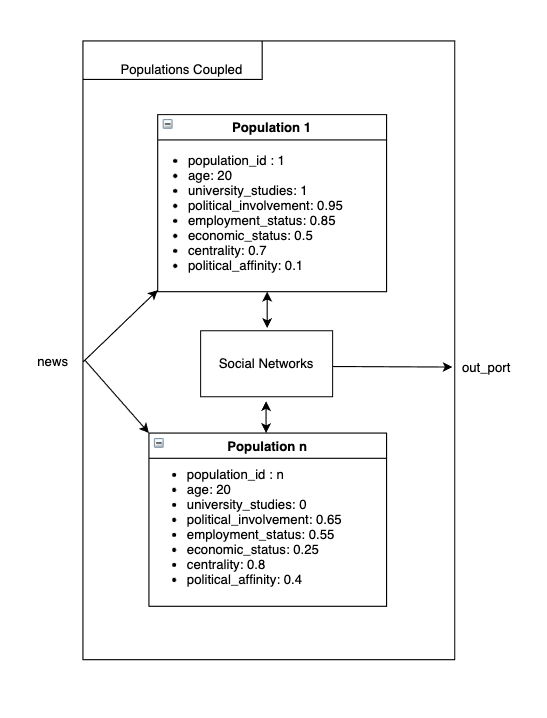

In [5]:
from IPython import display
display.Image("./populationsCoupled.png")

### Atómico: Redes sociales

Cada fake emitida por los grupos sociales ingresan como entradas a las redes sociales. El mensaje enviado contendrá la información sobre la fake y además los traits de la población emisora. Este mensaje, luego se enviará al resto de grupos sociales.


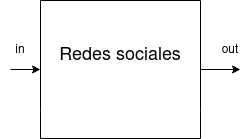

In [13]:
from IPython import display
display.Image("./redes.png")

### Atómico Población

Este atómico recibe como entrada las fake news emitidas por los medios y también las opiniones emitidas por es resto de las poblaciones de dicha fake news. 

Como salida emite la opinión de la fake news y su afinidad con el gobierno.



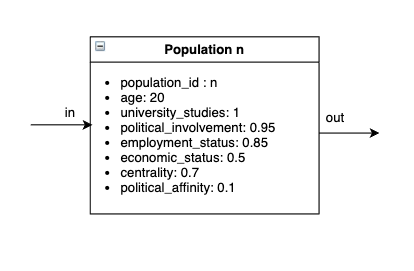

In [6]:
from IPython import display
display.Image("./population.png")

In [2]:
from pathlib import Path

SED_HOME = Path.home().joinpath('SED')

#Directorio base donde está instalado el siumulador
CDPP_DIR = SED_HOME.joinpath('CDPP_ExtendedStates-codename-Santi')

CDPP_SRC = CDPP_DIR.joinpath('src')
CDPP_EXAMPLES = CDPP_DIR.joinpath('examples')
CDPP_SCRIPTS = CDPP_DIR.joinpath('scripts')
BASE_BIN = CDPP_SRC.joinpath('bin')
CDPP_ATOMICS = CDPP_SRC.joinpath('cd++/atomics')

## Primer experimento

En el .ma seteamos la frecuencia de la creación de fake news y algunos parámetros de las poblaciones:
En este caso vamos a comenzar con el escenario en que:
- Se emiten 20% de fake news que atacan a la oposición y 80% de las fake news atacarán al oficialismo.
- Hay un 50% de poblaciones con estudios universitarios,
- Hay un 50% de poblaciones con un alto promedio de involucramiento político
- Hay un 50% de poblaciones con un estado laboral no precario
- Hay un 50% de poblaciones con un nivel económico no extremo


In [55]:
%%bash -s "$CDPP_EXAMPLES"

cd $1/fakeNewsPropagation-main/model/

cat fakeNewsPropagation.ma

[top]
components : fakenewsgenerator@fakenewsgenerator mediaOfficial@media mediaOpposition@media populationscoupled
out : out_port
in : stop
link : stop stop@fakenewsgenerator
link : out@fakenewsgenerator in@mediaOfficial
link : out@fakenewsgenerator in@mediaOpposition
link : out@mediaOfficial news@populationscoupled
link : out@mediaOpposition news@populationscoupled
link : out_port@populationscoupled out_port

[fakenewsgenerator]
frequency : 00:15:00:00
dist: 0.2

[mediaOfficial]
party : 1

[mediaOpposition]
party : 0

[populationscoupled]
components : socialnetworks@socialnetworks population1@population population2@population population3@population population4@population population5@population population6@population population7@population population8@population

out : out_port
in : news
link : news in@population1
link : news in@population2
link : news in@population3
link : news in@population4
 link : news in@population5
 link : news in@population6
 link : news in@population7
 link : 

## Para compilar el modelo:

In [59]:
%%bash

cd '../src'

# limpiamos compilaciones viejas si las hay
#make clean

# compilamos cd++ (esto demora unos minutos y no se ve ninguna salida... sólo mensajes de g++ y warnings al final)
make -j4

make -C ../../../SED/CDPP_ExtendedStates-codename-Santi/src/cd++ cd++ OUT_DIR=/home/matias/Desktop/fakeNewsPropagator/src/bin MODEL_FLAGS=-DREGISTER_ATOMICS
make[1]: Entering directory '/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++'
make -C /home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++/atomics OBJ_DIR=obj SRC_DIR=/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++ MODEL_FLAGS=-DREGISTER_ATOMICS
make -C /home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++/cell OBJ_DIR=obj SRC_DIR=/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++ MODEL_FLAGS=-DREGISTER_ATOMICS
make[2]: Entering directory '/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++/atomics'
make -C cpu OBJ_DIR=obj SRC_DIR=/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++
make -C queue OBJ_DIR=obj SRC_DIR=/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++
make -C qss OBJ_DIR=obj SRC_DIR=/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd

/usr/bin/ld: /home/matias/Desktop/fakeNewsPropagator/src/bin/libsimu.a(macroexp.o): in function `macroExpansion::expand[abi:cxx11]()':
/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++/utils/macroexp.cpp:147: warning: the use of `tmpnam' is dangerous, better use `mkstemp'
/usr/bin/ld: warped/notime/obj/DebugStream.o: in function `DebugStream::interact()':
/home/matias/SED/CDPP_ExtendedStates-codename-Santi/src/cd++/warped/notime/DebugStream.cpp:682: warning: the `gets' function is dangerous and should not be used.


## Simulación del modelo:

In [62]:
%%bash

cd '../src'

bin/cd++ -m ../model/fakeNewsPropagation.ma  \
         -e ../model/fakeNewsPropagation.ev  \
         -l ../fakeNewsPropagation.log \
         -o ../fakeNewsPropagation.out

PCD++: A Tool to Implement n-Dimensional Cell-DEVS models
Version 3.0 - March 2003
Troccoli A., Rodriguez D., Wainer G., Barylko A., Beyoglonian J., Lopez A.
-----------------------------------------------------------------------------
PCD++ Extended States: An extended and improved version of CD++ for Cell-DEVS
Version 4.1.2 - December 2018
Santi L., Castro, R., Pimás, J.
-----------------------------------------------------------------------------
Discrete Event Simulation Lab
Departamento de Computación
Facultad de Ciencias Exactas y Naturales
Universidad de Buenos Aires, Argentina
-----------------------------------------------------------------------------
Compiled for standalone simulation


Loading models from ../model/fakeNewsPropagation.ma
Loading events from ../model/fakeNewsPropagation.ev
Running parallel simulation. Reading models partition from 
Model partition details output to: /dev/null*
Message log: ../fakeNewsPropagation.log
Output to: ../fakeNewsPropagation.out
Toler

PCD++: A Tool to Implement n-Dimensional Cell-DEVS models
Version 3.0 - March 2003
Troccoli A., Rodriguez D., Wainer G., Barylko A., Beyoglonian J., Lopez A.
-----------------------------------------------------------------------------
PCD++ Extended States: An extended and improved version of CD++ for Cell-DEVS
Version 4.1.2 - December 2018
Santi L., Castro, R., Pimás, J.
-----------------------------------------------------------------------------
Discrete Event Simulation Lab
Departamento de Computación
Facultad de Ciencias Exactas y Naturales
Universidad de Buenos Aires, Argentina
-----------------------------------------------------------------------------
Compiled for standalone simulation


Loading models from ../model/fakeNewsPropagation.ma
Loading events from ../model/fakeNewsPropagation.ev
Running parallel simulation. Reading models partition from 
Model partition details output to: /dev/null*
Message log: ../fakeNewsPropagation.log
Output to: ../fakeNewsPropagation.out
Toler

## Análisis de Resultados

Para observar cómo influyeron las fakenews en los diversos grupos sociales, proponemos analizar el cambio individual del trait "afinidad_política" de algunos grupos individualmente y por otro lado observar cómo evolucionó la cantidad de grupos afines y opositores en el tiempo.

In [63]:
try:
    import pandas as pd
except:
    !pip install pandas
    import pandas as pd
    

In [64]:
try:
    import scipy as sp
except:
    !pip install scipy
    import scipy as sp

In [65]:
try:
    import matplotlib.pyplot as plt
except:
    !pip install matplotlib
    import matplotlib.pyplot as plt

###  Primer análisis: cómo evoluciona la afinidad política de una población

In [72]:
OUT_FILENAME = '../fakeNewsPropagation.out'

# definimos los nombres de las columnas en los dataframes de pandas
TIME_COL_ORIG = 'time_orig'
TIME_COL = 'time'
PORT_COL = 'port'
VALUE_COL_ORIG = 'value_orig'
VALUE_COL = 'value'
POPULATION_COL = 'population'
POLITICAL_AFFINITY = 'political_affinity'
MESSAGE_TYPE_COL = 'message_type'
MODEL_ORIGIN_COL = 'model_origin'
MODEL_DEST_COL = 'model_dest'

# parsea cada fila del dataframe
def parse_value(value):
    is_list = value.strip().startswith("[") and value.strip().endswith("]")
    if is_list:
        return tuple(float(num) for num in value.replace('[', '').replace(']', '').split(', '))
    return float(value)

#conversion VTime a float
def time_to_secs(time):
    h, m, s, ms, r = time.split(':')
    return float(h)*60*60. + float(m)*60. + float(s) + float(ms)/1000. + float(r)/1000.

#conversion string to list
def value_to_list(value):
    tempValue = value[1:-1]
    return tempValue.split(',')

df_converters = {
     VALUE_COL: parse_value,
     TIME_COL: time_to_secs
 }

salida = pd.read_csv(OUT_FILENAME,
                     delimiter=r'(?<!,)\s+',
                     engine='python',  # C engine doesnt work for regex
                     # Se puede usar esto para convertir los valores directamente:
                     # converters=df_converters,
                     names=[TIME_COL_ORIG, PORT_COL, VALUE_COL_ORIG]
                    )

salida[TIME_COL]  = salida.apply(lambda row: time_to_secs(row[TIME_COL_ORIG]), axis=1)
salida[VALUE_COL] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG])), axis=1)
salida[POPULATION_COL] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG]))[0], axis=1)
salida[POLITICAL_AFFINITY] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG]))[1], axis=1)


outs_estadisticos = salida.loc[ salida['value'].str.len() == 2]
population1 = outs_estadisticos.loc[ salida['population'] == '1']
population2 = outs_estadisticos.loc[ salida['population'] == '2']
population3 = outs_estadisticos.loc[ salida['population'] == '3']
population4 = outs_estadisticos.loc[ salida['population'] == '4']
population5 = outs_estadisticos.loc[ salida['population'] == '5']
population6 = outs_estadisticos.loc[ salida['population'] == '6']
population7 = outs_estadisticos.loc[ salida['population'] == '7']
population8 = outs_estadisticos.loc[ salida['population'] == '8']

population1



,time_orig,port,value_orig,time,value,population,political_affinity
2,00:00:00:330:0,out_port,"[1, 0.1]",0.330,"[1, 0.1]",1,0.1
20,00:15:02:102:0,out_port,"[1, 0.0962326]",902.102,"[1, 0.0962326]",1,0.0962326
29,00:15:03:018:0,out_port,"[1, 0.0949751]",903.018,"[1, 0.0949751]",1,0.0949751
37,00:15:03:885:0,out_port,"[1, 0.0985403]",903.885,"[1, 0.0985403]",1,0.0985403
46,00:15:04:592:0,out_port,"[1, 0.0915367]",904.592,"[1, 0.0915367]",1,0.0915367
...,...,...,...,...,...,...,...
2453,05:00:02:964:0,out_port,"[1, 0.151769]",18002.964,"[1, 0.151769]",1,0.151769
2473,05:00:04:696:0,out_port,"[1, 0.15353]",18004.696,"[1, 0.15353]",1,0.15353
2477,05:00:04:880:0,out_port,"[1, 0.157304]",18004.880,"[1, 0.157304]",1,0.157304
2488,05:00:05:617:0,out_port,"[1, 0.149999]",18005.617,"[1, 0.149999]",1,0.149999


Este es un ejemplo de las salidas consecutivas de la población 1

Luego observaremos en un gráfico las salidas de las ocho poblaciones:

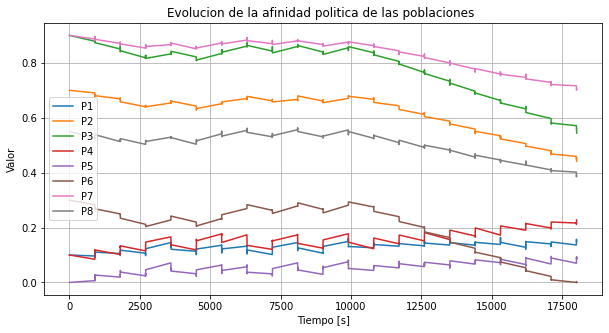

In [73]:
y_strings1 = population1[POLITICAL_AFFINITY].tolist()
x_string1 = population1[TIME_COL].tolist()
y_values1 = list(map(float, y_strings1))
x_values1 = list(map(float, x_string1))

y_strings2 = population2[POLITICAL_AFFINITY].tolist()
x_string2 = population2[TIME_COL].tolist()
y_values2 = list(map(float, y_strings2))
x_values2 = list(map(float, x_string2))

y_strings3 = population3[POLITICAL_AFFINITY].tolist()
x_string3 = population3[TIME_COL].tolist()
y_values3 = list(map(float, y_strings3))
x_values3 = list(map(float, x_string3))

y_strings4 = population4[POLITICAL_AFFINITY].tolist()
x_string4 = population4[TIME_COL].tolist()
y_values4 = list(map(float, y_strings4))
x_values4 = list(map(float, x_string4))

y_strings5 = population5[POLITICAL_AFFINITY].tolist()
x_string5 = population5[TIME_COL].tolist()
y_values5 = list(map(float, y_strings5))
x_values5 = list(map(float, x_string5))

y_strings6 = population6[POLITICAL_AFFINITY].tolist()
x_string6 = population6[TIME_COL].tolist()
y_values6 = list(map(float, y_strings6))
x_values6 = list(map(float, x_string6))

y_strings7 = population7[POLITICAL_AFFINITY].tolist()
x_string7 = population7[TIME_COL].tolist()
y_values7 = list(map(float, y_strings7))
x_values7 = list(map(float, x_string7))

y_strings8 = population8[POLITICAL_AFFINITY].tolist()
x_string8 = population8[TIME_COL].tolist()
y_values8 = list(map(float, y_strings8))
x_values8 = list(map(float, x_string8))

plt.figure(figsize=(10,5))
plt.plot( x_values1, y_values1,label='P1')
plt.plot( x_values2, y_values2,label='P2')
plt.plot( x_values3, y_values3,label='P3')
plt.plot( x_values4, y_values4,label='P4')
plt.plot( x_values5, y_values5,label='P5')
plt.plot( x_values6, y_values6,label='P6')
plt.plot( x_values7, y_values7,label='P7')
plt.plot( x_values8, y_values8,label='P8')

plt.grid(True)
plt.legend()
plt.xlabel('Tiempo [s]')
plt.ylabel('Valor')
plt.title('Evolucion de la afinidad politica de las poblaciones ');

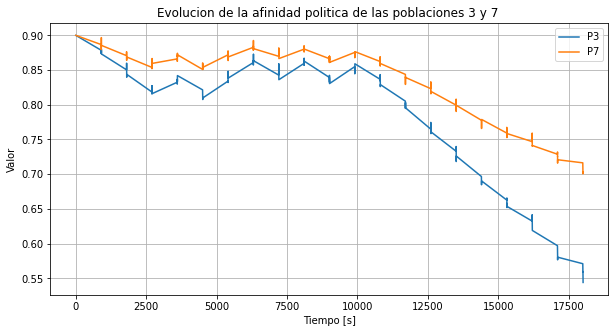

In [74]:

plt.figure(figsize=(10,5))
plt.plot( x_values3, y_values3,label='P3')
plt.plot( x_values7, y_values7,label='P7')

plt.grid(True)
plt.legend()
plt.xlabel('Tiempo [s]')
plt.ylabel('Valor')
plt.title('Evolucion de la afinidad politica de las poblaciones 3 y 7 ');

En el gráfico de arriba podemos observar cómo dos poblaciones que comienzan con el mismo valor de afinidad al partido oficialista (P3 y P7), tienen una evolución diferente de la misma debido a sus distintas características. En particular, se nota que la poblacion 7, al tener mejor resistencia a dejarse creer por la fake new (tiene estudios universitarios, está involucrado politicamente y un estado laboral más estable, entre otras), varía menos su afinidad política.

[population3]
- population_id : 3
- age : 50
- university_studies : 0
- political_involvement : 0.15
- employment_status : 0.1
- economic_status : 0.95
- centrality : 0.3
- political_affinity: 0.9


[population7]
- population_id : 7
- age : 55
- university_studies : 1
- political_involvement : 0.85
- employment_status : 0.9
- economic_status : 0.5
- centrality : 0.2
- political_affinity: 0.9

### Evolución en cantidad de poblaciones oficialistas:

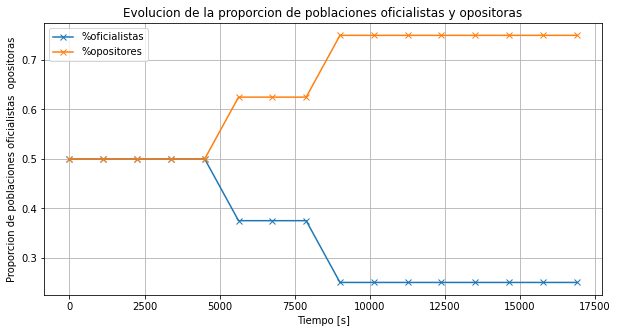

In [90]:
outs_estadisticos = salida.loc[ salida['value'].str.len() == 2]
maxtime=outs_estadisticos.iloc[-1, outs_estadisticos.columns.get_loc("time")]
steps = 16
populations = ['1','2','3','4','5','6','7','8']

officialist_proportion_array = []
opposition_proportion_array = []
time_array = []

for i in range (steps):
  time_array.append(i*maxtime/steps)
  time_range_rows = outs_estadisticos.loc[ (salida['time'] > i*maxtime/steps) & (salida['time'] <= (i*maxtime/steps)+maxtime/steps) ]
  OffPopCount = 0

  for population in populations:
    lastPopOutput = time_range_rows.loc[ (salida['population'] == population)].iloc[-1:] 
    if float(lastPopOutput['political_affinity'].item()) > 0.5:
      OffPopCount = OffPopCount + 1
  
  officialist_proportion_array.append(float(OffPopCount)/len(populations))
  opposition_proportion_array.append(1-float(OffPopCount)/len(populations))
  
time_array_rounded = [round(num, 1) for num in time_array]
  
plt.figure(figsize=(10,5))
plt.plot(time_array_rounded, officialist_proportion_array,marker='x',label='%oficialistas')
plt.plot(time_array_rounded, opposition_proportion_array,marker='x',label='%opositores')

plt.grid(True)
plt.legend()
plt.xlabel('Tiempo [s]')
plt.ylabel('Proporcion de poblaciones oficialistas  opositoras')
plt.title('Evolucion de la proporcion de poblaciones oficialistas y opositoras');

Se observa que disminuye la cantidad de poblaciones oficialistas, lo cual tiene sentido ya que la mayoría de las fake news atacaban a aquel partido en esta primera simulación. Además, podemos ver que el porcentaje de poblaciones de cada partido converge al porcentaje de fake news que atacan al partido contrario.

### Experimento 2
Si modificamos en el .ma el porcentaje de fake news de la siguiente manera:
-  Se emiten 40% de fake news que atacan a la oposición y 60% de las fake news atacarán al oficialismo.

Y mantenemos los siguientes valores: 

- Hay un 50% de poblaciones con estudios universitarios,
- Hay un 50% de poblaciones con un alto promedio de involucramiento político
- Hay un 50% de poblaciones con un estado laboral no precario
- Hay un 50% de poblaciones con un nivel económico no extremo



In [106]:
%%bash

cd '../src'

bin/cd++ -m ../model/fakeNewsPropagation-2.ma  \
         -e ../model/fakeNewsPropagation.ev  \
         -l ../fakeNewsPropagation.log \
         -o ../fakeNewsPropagation-2.out

PCD++: A Tool to Implement n-Dimensional Cell-DEVS models
Version 3.0 - March 2003
Troccoli A., Rodriguez D., Wainer G., Barylko A., Beyoglonian J., Lopez A.
-----------------------------------------------------------------------------
PCD++ Extended States: An extended and improved version of CD++ for Cell-DEVS
Version 4.1.2 - December 2018
Santi L., Castro, R., Pimás, J.
-----------------------------------------------------------------------------
Discrete Event Simulation Lab
Departamento de Computación
Facultad de Ciencias Exactas y Naturales
Universidad de Buenos Aires, Argentina
-----------------------------------------------------------------------------
Compiled for standalone simulation


Loading models from ../model/fakeNewsPropagation-2.ma
Loading events from ../model/fakeNewsPropagation.ev
Running parallel simulation. Reading models partition from 
Model partition details output to: /dev/null*
Message log: ../fakeNewsPropagation.log
Output to: ../fakeNewsPropagation-2.out
T

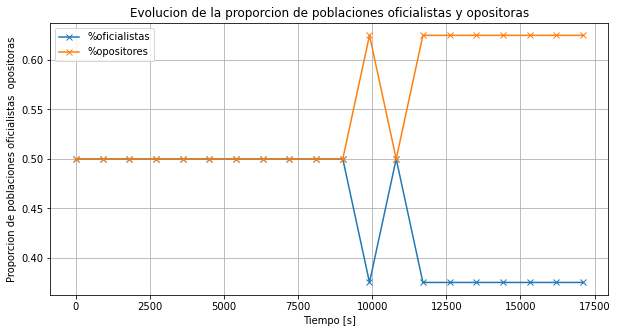

In [107]:
OUT_FILENAME = '../fakeNewsPropagation-2.out'

# definimos los nombres de las columnas en los dataframes de pandas
TIME_COL_ORIG = 'time_orig'
TIME_COL = 'time'
PORT_COL = 'port'
VALUE_COL_ORIG = 'value_orig'
VALUE_COL = 'value'
POPULATION_COL = 'population'
POLITICAL_AFFINITY = 'political_affinity'
MESSAGE_TYPE_COL = 'message_type'
MODEL_ORIGIN_COL = 'model_origin'
MODEL_DEST_COL = 'model_dest'
steps = 20

# parsea cada fila del dataframe
def parse_value(value):
    is_list = value.strip().startswith("[") and value.strip().endswith("]")
    if is_list:
        return tuple(float(num) for num in value.replace('[', '').replace(']', '').split(', '))
    return float(value)

#conversion VTime a float
def time_to_secs(time):
    h, m, s, ms, r = time.split(':')
    return float(h)*60*60. + float(m)*60. + float(s) + float(ms)/1000. + float(r)/1000.

#conversion string to list
def value_to_list(value):
    tempValue = value[1:-1]
    return tempValue.split(',')

df_converters = {
     VALUE_COL: parse_value,
     TIME_COL: time_to_secs
 }

salida = pd.read_csv(OUT_FILENAME,
                     delimiter=r'(?<!,)\s+',
                     engine='python',  # C engine doesnt work for regex
                     # Se puede usar esto para convertir los valores directamente:
                     # converters=df_converters,
                     names=[TIME_COL_ORIG, PORT_COL, VALUE_COL_ORIG]
                    )

salida[TIME_COL]  = salida.apply(lambda row: time_to_secs(row[TIME_COL_ORIG]), axis=1)
salida[VALUE_COL] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG])), axis=1)
salida[POPULATION_COL] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG]))[0], axis=1)
salida[POLITICAL_AFFINITY] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG]))[1], axis=1)

outs_estadisticos = salida.loc[ salida['value'].str.len() == 2]
maxtime=outs_estadisticos.iloc[-1, outs_estadisticos.columns.get_loc("time")]
populations = ['1','2','3','4','5','6','7','8']

officialist_proportion_array = []
opposition_proportion_array = []
time_array = []

for i in range (steps):
  time_array.append(i*maxtime/steps)
  time_range_rows = outs_estadisticos.loc[ (salida['time'] > i*maxtime/steps) & (salida['time'] <= (i*maxtime/steps)+maxtime/steps) ]
  OffPopCount = 0

  for population in populations:
    lastPopOutput = time_range_rows.loc[ (salida['population'] == population)].iloc[-1:] 
    if float(lastPopOutput['political_affinity'].item()) > 0.5:
      OffPopCount = OffPopCount + 1
  
  officialist_proportion_array.append(float(OffPopCount)/len(populations))
  opposition_proportion_array.append(1-float(OffPopCount)/len(populations))
  
time_array_rounded = [round(num, 1) for num in time_array]
  
plt.figure(figsize=(10,5))
plt.plot(time_array_rounded, officialist_proportion_array,marker='x',label='%oficialistas')
plt.plot(time_array_rounded, opposition_proportion_array,marker='x',label='%opositores')

plt.grid(True)
plt.legend()
plt.xlabel('Tiempo [s]')
plt.ylabel('Proporcion de poblaciones oficialistas  opositoras')
plt.title('Evolucion de la proporcion de poblaciones oficialistas y opositoras');

Del gráfico de arriba se desprende que tener un 50% de la sociedad con características "resistentes" a las fake news hace que la polarización de la sociedad tenga una proporción similar a la de los partidos de las fake news. Es decir, tener al menos un 50% de la sociedad resistente a las fake news parece ser suficiente para que el impacto de las fake news sea ligeramente superior a la proporción de las mismas.

### Experimento 3
Si en cambio modificamos en el .ma las características de la población de la siguiente manera:


- Hay un 25% de poblaciones con estudios universitarios,
- Hay un 25% de poblaciones con un alto promedio de involucramiento político
- Hay un 25% de poblaciones con un estado laboral no precario
- Hay un 25% de poblaciones con un nivel económico no extremo

Y mantenemos los siguientes valores: 

-  Se emiten 40% de fake news que atacan a la oposición y 60% de las fake news atacarán al oficialismo.


In [111]:
%%bash

cd '../src'

bin/cd++ -m ../model/fakeNewsPropagation-3.ma  \
         -e ../model/fakeNewsPropagation.ev  \
         -l ../fakeNewsPropagation-3.log \
         -o ../fakeNewsPropagation-3.out

PCD++: A Tool to Implement n-Dimensional Cell-DEVS models
Version 3.0 - March 2003
Troccoli A., Rodriguez D., Wainer G., Barylko A., Beyoglonian J., Lopez A.
-----------------------------------------------------------------------------
PCD++ Extended States: An extended and improved version of CD++ for Cell-DEVS
Version 4.1.2 - December 2018
Santi L., Castro, R., Pimás, J.
-----------------------------------------------------------------------------
Discrete Event Simulation Lab
Departamento de Computación
Facultad de Ciencias Exactas y Naturales
Universidad de Buenos Aires, Argentina
-----------------------------------------------------------------------------
Compiled for standalone simulation


Loading models from ../model/fakeNewsPropagation-3.ma
Loading events from ../model/fakeNewsPropagation.ev
Running parallel simulation. Reading models partition from 
Model partition details output to: /dev/null*
Message log: ../fakeNewsPropagation-3.log
Output to: ../fakeNewsPropagation-3.out

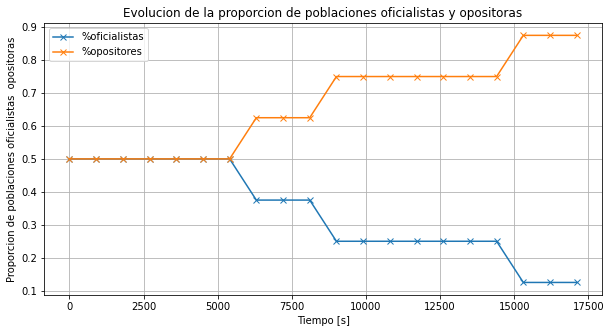

In [113]:
# definimos los path a los archivos de interés
OUT_FILENAME = "../fakeNewsPropagation-3.out"

# con el script tuple_to_real elegimos el índice 0 de la 3-upla
# tuple_to_real.tuple_to_real(OUT_FILENAME, 0)

# definimos los nombres de las columnas en los dataframes de pandas
TIME_COL_ORIG = 'time_orig'
TIME_COL = 'time'
PORT_COL = 'port'
VALUE_COL_ORIG = 'value_orig'
VALUE_COL = 'value'
POPULATION_COL = 'population'
POLITICAL_AFFINITY = 'political_affinity'
MESSAGE_TYPE_COL = 'message_type'
MODEL_ORIGIN_COL = 'model_origin'
MODEL_DEST_COL = 'model_dest'

# parsea cada fila del dataframe
def parse_value(value):
    is_list = value.strip().startswith("[") and value.strip().endswith("]")
    if is_list:
        return tuple(float(num) for num in value.replace('[', '').replace(']', '').split(', '))
    return float(value)


#conversion VTime a float


def time_to_secs(time):
    h, m, s, ms, r = time.split(':')
    return float(h)*60*60. + float(m)*60. + float(s) + float(ms)/1000. + float(r)/1000.

#conversion string to list
def value_to_list(value):
    tempValue = value[1:-1]
    return tempValue.split(',')

def value_to_float(value):
    tempValue = value[1:-1]
    tempValue2 =tempValue.split(',')
    return float(tempValue2[1])

df_converters = {
     VALUE_COL: parse_value,
     TIME_COL: time_to_secs
 }

salida = pd.read_csv(OUT_FILENAME,
                     delimiter=r'(?<!,)\s+',
                     engine='python',  # C engine doesnt work for regex
                     # Se puede usar esto para convertir los valores directamente:
                     # converters=df_converters,
                     names=[TIME_COL_ORIG, PORT_COL, VALUE_COL_ORIG]
                    )

salida[TIME_COL]  = salida.apply(lambda row: time_to_secs(row[TIME_COL_ORIG]), axis=1)
salida[VALUE_COL] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG])), axis=1)
salida[POPULATION_COL] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG]))[0], axis=1)
salida[POLITICAL_AFFINITY] = salida.apply(lambda row: value_to_float((row[VALUE_COL_ORIG])), axis=1)


outs_estadisticos = salida.loc[ salida['value'].str.len() == 2]
maxtime=outs_estadisticos.iloc[-1, outs_estadisticos.columns.get_loc("time")]
steps = 20
populations = ['1','2','3','4','5','6','7','8']

officialist_proportion_array = []
opposition_proportion_array = []
time_array = []

for i in range (steps):
  time_array.append(i*maxtime/steps)
  time_range_rows = outs_estadisticos.loc[ (salida['time'] > i*maxtime/steps) & (salida['time'] <= (i*maxtime/steps)+maxtime/steps) ]
  OffPopCount = 0

  for population in populations:
    lastPopOutput = time_range_rows.loc[ (salida['population'] == population)].iloc[-1:] 
    if lastPopOutput['political_affinity'].item() > 0.5:
      OffPopCount = OffPopCount + 1
  
  officialist_proportion_array.append(float(OffPopCount)/len(populations))
  opposition_proportion_array.append(1-float(OffPopCount)/len(populations))
  
time_array_rounded = [round(num, 1) for num in time_array]
  
plt.figure(figsize=(10,5))
plt.plot(time_array_rounded, officialist_proportion_array,marker='x',label='%oficialistas')
plt.plot(time_array_rounded, opposition_proportion_array,marker='x',label='%opositores')

plt.grid(True)
plt.legend()
plt.xlabel('Tiempo [s]')
plt.ylabel('Proporcion de poblaciones oficialistas  opositoras')
plt.title('Evolucion de la proporcion de poblaciones oficialistas y opositoras');

Acá es importante percartarse de que aunque la proporción de las fake news sea 40-60, la afinidad política de las poblaciones se vuelve mucho mas distanciada, seguramente debido a las características de los mismos. Bajos porcentajes de estudios universitarios, involucramiento político, y estar en un estado laboral precario y en un extremo económico, conllevan una gran polarización de la sociedad.

### Experimento 4
Si por último modificamos en el .ma las características de la población de la siguiente manera:


- Hay un 25% de poblaciones con estudios universitarios,
- Hay un 25% de poblaciones con un alto promedio de involucramiento político
- Hay un 25% de poblaciones con un estado laboral no precario
- Hay un 25% de poblaciones con un nivel económico no extremo
- Se emiten 20% de fake news que atacan a la oposición y 80% de las fake news atacarán al oficialismo.


In [114]:
%%bash

cd '../src'

bin/cd++ -m ../model/fakeNewsPropagation-4.ma  \
         -e ../model/fakeNewsPropagation.ev  \
         -l ../fakeNewsPropagation-4.log \
         -o ../fakeNewsPropagation-4.out

PCD++: A Tool to Implement n-Dimensional Cell-DEVS models
Version 3.0 - March 2003
Troccoli A., Rodriguez D., Wainer G., Barylko A., Beyoglonian J., Lopez A.
-----------------------------------------------------------------------------
PCD++ Extended States: An extended and improved version of CD++ for Cell-DEVS
Version 4.1.2 - December 2018
Santi L., Castro, R., Pimás, J.
-----------------------------------------------------------------------------
Discrete Event Simulation Lab
Departamento de Computación
Facultad de Ciencias Exactas y Naturales
Universidad de Buenos Aires, Argentina
-----------------------------------------------------------------------------
Compiled for standalone simulation


Loading models from ../model/fakeNewsPropagation-4.ma
Loading events from ../model/fakeNewsPropagation.ev
Running parallel simulation. Reading models partition from 
Model partition details output to: /dev/null*
Message log: ../fakeNewsPropagation-4.log
Output to: ../fakeNewsPropagation-4.out

[0.5, 0.5, 0.375, 0.375, 0.375, 0.375, 0.375, 0.375, 0.5, 0.375, 0.375, 0.375, 0.25, 0.25, 0.25, 0.25, 0.25, 0.125, 0.125, 0.125]
[0.0, 900.5, 1800.9, 2701.4, 3601.9, 4502.3, 5402.8, 6303.3, 7203.7, 8104.2, 9004.7, 9905.1, 10805.6, 11706.0, 12606.5, 13507.0, 14407.4, 15307.9, 16208.4, 17108.8]


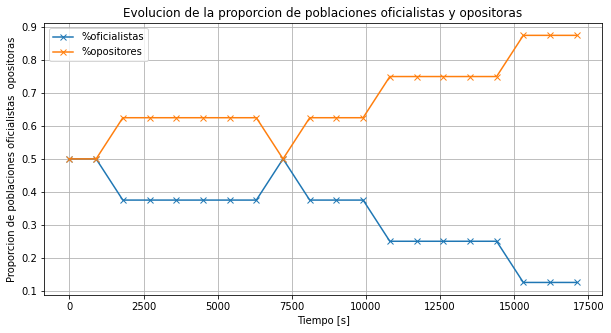

In [116]:
# definimos los path a los archivos de interés
OUT_FILENAME = "../fakeNewsPropagation-4.out"

# con el script tuple_to_real elegimos el índice 0 de la 3-upla
# tuple_to_real.tuple_to_real(OUT_FILENAME, 0)

# definimos los nombres de las columnas en los dataframes de pandas
TIME_COL_ORIG = 'time_orig'
TIME_COL = 'time'
PORT_COL = 'port'
VALUE_COL_ORIG = 'value_orig'
VALUE_COL = 'value'
POPULATION_COL = 'population'
POLITICAL_AFFINITY = 'political_affinity'
MESSAGE_TYPE_COL = 'message_type'
MODEL_ORIGIN_COL = 'model_origin'
MODEL_DEST_COL = 'model_dest'

# parsea cada fila del dataframe
def parse_value(value):
    is_list = value.strip().startswith("[") and value.strip().endswith("]")
    if is_list:
        return tuple(float(num) for num in value.replace('[', '').replace(']', '').split(', '))
    return float(value)


#conversion VTime a float


def time_to_secs(time):
    h, m, s, ms, r = time.split(':')
    return float(h)*60*60. + float(m)*60. + float(s) + float(ms)/1000. + float(r)/1000.

#conversion string to list
def value_to_list(value):
    tempValue = value[1:-1]
    return tempValue.split(',')

def value_to_float(value):
    tempValue = value[1:-1]
    tempValue2 =tempValue.split(',')
    return float(tempValue2[1])

df_converters = {
     VALUE_COL: parse_value,
     TIME_COL: time_to_secs
 }

salida = pd.read_csv(OUT_FILENAME,
                     delimiter=r'(?<!,)\s+',
                     engine='python',  # C engine doesnt work for regex
                     # Se puede usar esto para convertir los valores directamente:
                     # converters=df_converters,
                     names=[TIME_COL_ORIG, PORT_COL, VALUE_COL_ORIG]
                    )

salida[TIME_COL]  = salida.apply(lambda row: time_to_secs(row[TIME_COL_ORIG]), axis=1)
salida[VALUE_COL] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG])), axis=1)
salida[POPULATION_COL] = salida.apply(lambda row: value_to_list(str(row[VALUE_COL_ORIG]))[0], axis=1)
salida[POLITICAL_AFFINITY] = salida.apply(lambda row: value_to_float((row[VALUE_COL_ORIG])), axis=1)


outs_estadisticos = salida.loc[ salida['value'].str.len() == 2]
maxtime=outs_estadisticos.iloc[-1, outs_estadisticos.columns.get_loc("time")]
steps = 20
populations = ['1','2','3','4','5','6','7','8']

officialist_proportion_array = []
opposition_proportion_array = []
time_array = []

for i in range (steps):
  time_array.append(i*maxtime/steps)
  time_range_rows = outs_estadisticos.loc[ (salida['time'] > i*maxtime/steps) & (salida['time'] <= (i*maxtime/steps)+maxtime/steps) ]
  OffPopCount = 0

  for population in populations:
    lastPopOutput = time_range_rows.loc[ (salida['population'] == population)].iloc[-1:] 
    if lastPopOutput['political_affinity'].item() > 0.5:
      OffPopCount = OffPopCount + 1
  
  officialist_proportion_array.append(float(OffPopCount)/len(populations))
  opposition_proportion_array.append(1-float(OffPopCount)/len(populations))
  
time_array_rounded = [round(num, 1) for num in time_array]
print(officialist_proportion_array)
print(time_array_rounded)
  
plt.figure(figsize=(10,5))
plt.plot(time_array_rounded, officialist_proportion_array,marker='x',label='%oficialistas')
plt.plot(time_array_rounded, opposition_proportion_array,marker='x',label='%opositores')

plt.grid(True)
plt.legend()
plt.xlabel('Tiempo [s]')
plt.ylabel('Proporcion de poblaciones oficialistas  opositoras')
plt.title('Evolucion de la proporcion de poblaciones oficialistas y opositoras');

En este último gráfico se observa que una gran proporción de fake news que atacan a un partido, sumado a un alto número de poblaciones propensas a ser influenciadas por las fake news, tienen como resultado una gran polarización de la sociedad.

## Conclusiones 

Pudimos apreciar cómo dependiendo de las características de la población y las cantidades de fake news emitidas en el modelo se obtienen diversas evoluciones de las afinidades políticas dentro de la población
Se propone como una mejora, aumentar la diversidad de grupos sociales, diversificar los medios de comunicación y estudiar con mayor profundidad las hipótesis que influyen para modificar la afinidad hacia un partido político, en función de noticias escuchadas y la influencia de otros grupos de la sociedad para modelar de una manera más real estos comportamientos sociales

Un detalle para remarcar es el problema que genera la interconexión de todas las poblaciones entre sí. Esto nos limitó la posibilidad de realizar una simulación las larga, por la gran cantidad de recursos que se generan. 
Es un buen punto a tener en cuenta para comparar en el próximo trabajo con cell-devs

## Comentarios adicionales
Para testear los atómicos simulándolos de forma aislada, se crearon casos de prueba a mano, que se encuentran en el directorio "test" del proyecto.